In [1]:
# Algebra
import numpy as np

# dataframe
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# EDA

import pandas_profiling as pp

# algorithms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn import preprocessing

In [2]:
adata = pd.read_csv(r'F:\ML\autodata.csv')

### DATA PREPROCESSING :

In [3]:
adata.isnull().sum()

symboling           0
make                0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

* OBSERVATION : No null values present

In [4]:
adata.shape

(205, 25)

205 - rows and  25 - columns

In [5]:
adata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   symboling         205 non-null    int64  
 1   make              205 non-null    object 
 2   fueltype          205 non-null    object 
 3   aspiration        205 non-null    object 
 4   doornumber        205 non-null    object 
 5   carbody           205 non-null    object 
 6   drivewheel        205 non-null    object 
 7   enginelocation    205 non-null    object 
 8   wheelbase         205 non-null    float64
 9   carlength         205 non-null    float64
 10  carwidth          205 non-null    float64
 11  carheight         205 non-null    float64
 12  curbweight        205 non-null    int64  
 13  enginetype        205 non-null    object 
 14  cylindernumber    205 non-null    object 
 15  enginesize        205 non-null    int64  
 16  fuelsystem        205 non-null    object 
 1

In [6]:
adata.head()

,symboling,make,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


### using pandas-profiling to generate report

In [7]:
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

In [8]:
profile = ProfileReport(adata , title = 'Autodata', html= {'style' : {'full_width': True}}, sort= "None")

In [9]:
profile.to_notebook_iframe()

### ADVANCED EDA

<AxesSubplot:xlabel='symboling', ylabel='price'>

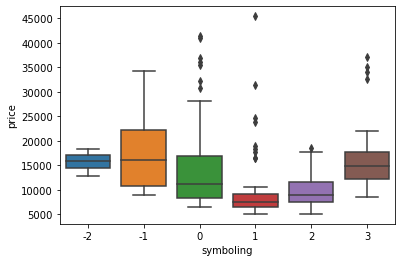

In [28]:
# what symbolling indicate about price
sns.boxplot(y = "price", x= "symboling", data = adata)

* both high risk and pretty safe symbolling has almost same price distibution, this is not a variable that affects the price of cars , it is just the symbol to show the risk

SO ITS BETTER TO REMOVE THIS COLUMN

## Dropping symbolling columns

In [29]:
adata  = adata.drop(['symboling'], axis = 1) 

SPLITTING  THE MAKE COLUMNS INTO MAKER AND CARNAME 

In [30]:
new = adata['make'].str.split(" ", n = 1, expand = True)

In [31]:
adata['maker'] = new[0]

In [32]:
adata['carname'] = new[1]

In [33]:
adata['maker'].replace({"vokswagen":"volkswagen","vw":"volkswagen"}, inplace = True)

In [34]:
adata['maker'].replace({"toyouta":"toyota"}, inplace = True)

In [35]:
adata['maker'].replace({"porcshce":"porsche"}, inplace = True)

In [36]:
adata['maker'].replace({"Nissan":"nissan"}, inplace = True)

In [37]:
adata['maker'].replace({"maxda":"mazda"}, inplace = True)

In [38]:
adata = adata.drop(['make'], axis = 1)

In [39]:
adata = adata.drop(['carname'], axis = 1)

<AxesSubplot:xlabel='price', ylabel='maker'>

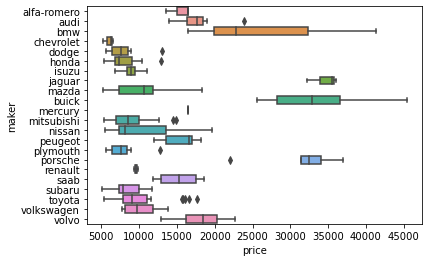

In [40]:
sns.boxplot(x = 'price', y= 'maker',data = adata)

In [41]:
adata['price'].value_counts()

5572.0     2
6692.0     2
7957.0     2
7898.0     2
6229.0     2
          ..
6377.0     1
30760.0    1
16925.0    1
15998.0    1
18920.0    1
Name: price, Length: 189, dtype: int64

In [42]:
adata.groupby('fueltype')['price'].sum()

fueltype
diesel     316763.000
gas       2404962.667
Name: price, dtype: float64

#### citympg and highwaympg

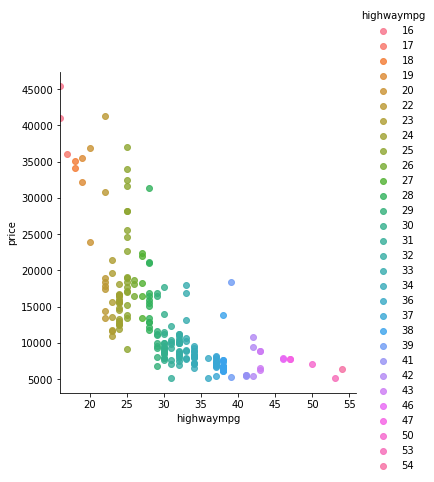

In [43]:
sns.lmplot(x= 'highwaympg', y = 'price',hue = 'highwaympg', data = adata)

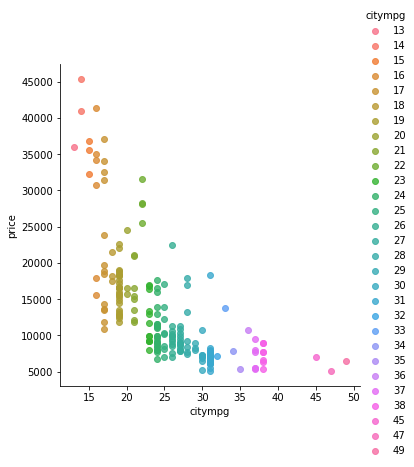

In [44]:
sns.lmplot(y= 'price', x = 'citympg',hue = 'citympg', data = adata)

####### city mileage and highway mileage are almost inversely related to price , both variable have same units so it can be converted into one variable 

In [45]:
adata['mpg']  = adata['highwaympg'] + adata['citympg']

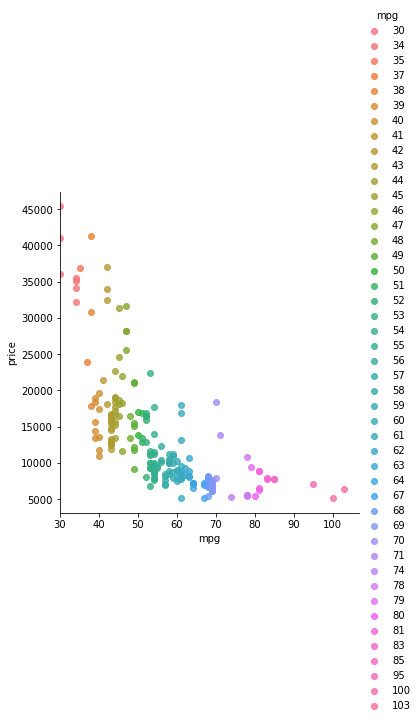

In [46]:
sns.lmplot(x = 'mpg', y = 'price', hue = 'mpg', data = adata)

##### it shows that mpg is keeping the essance of citympg and highwaympg

##### this shows the number of supercars are more inthis dataset

In [47]:
adata = adata.drop(['citympg'], axis = 1)

In [48]:
adata = adata.drop(['highwaympg'], axis= 1)

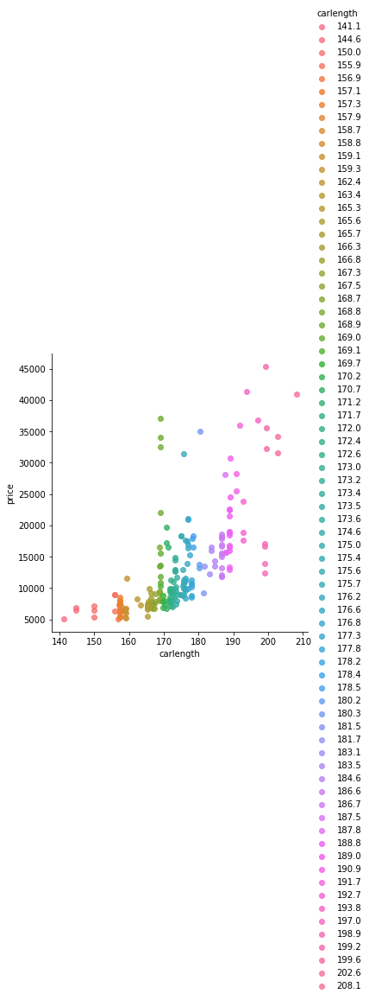

In [49]:
sns.lmplot(x= 'carlength', y = 'price', hue = 'carlength', data = adata)

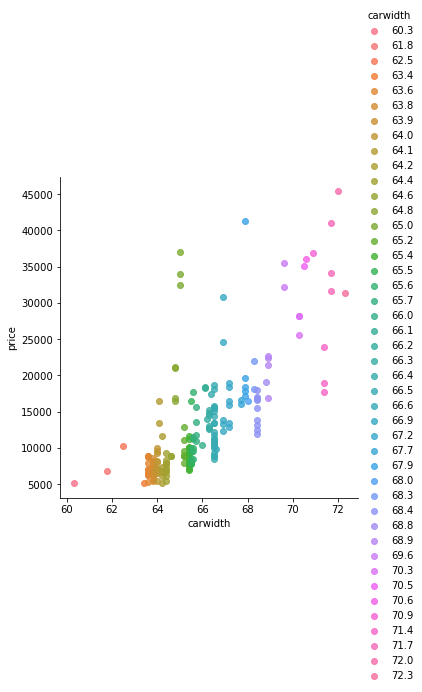

In [50]:
sns.lmplot(x= 'carwidth', y = 'price', hue = 'carwidth', data = adata)

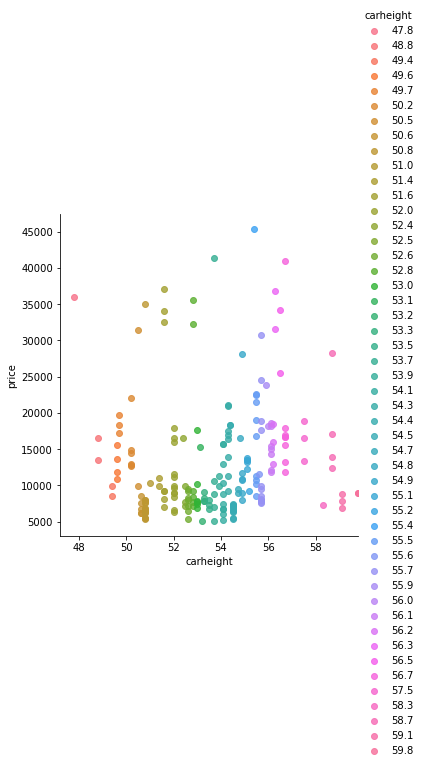

In [42]:
sns.lmplot(x= 'carheight', y = 'price', hue = 'carheight', data = adata)

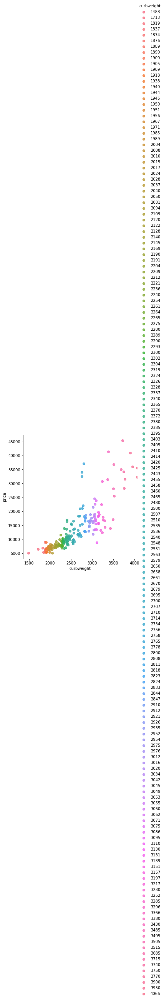

In [63]:
sns.lmplot(x= 'curbweight', y = 'price', hue = 'curbweight', data = adata)

In [43]:
adata['cardensity'] = (adata['carlength']*adata['carwidth']*adata['carheight'])/adata['curbweight']

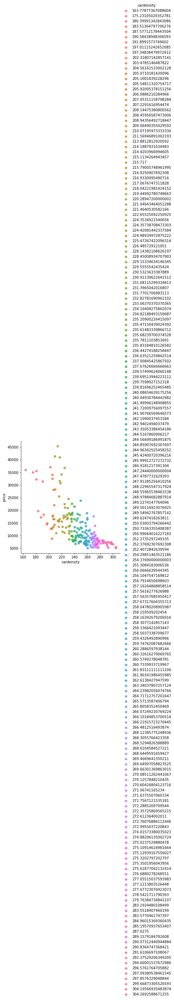

In [44]:
sns.lmplot(x= 'cardensity', y = 'price', hue = 'cardensity', data = adata)

In [45]:
adata = adata.drop(['carlength','carwidth','carheight','curbweight'], axis = 1)

* car density  = cardensity without cargo or passenger

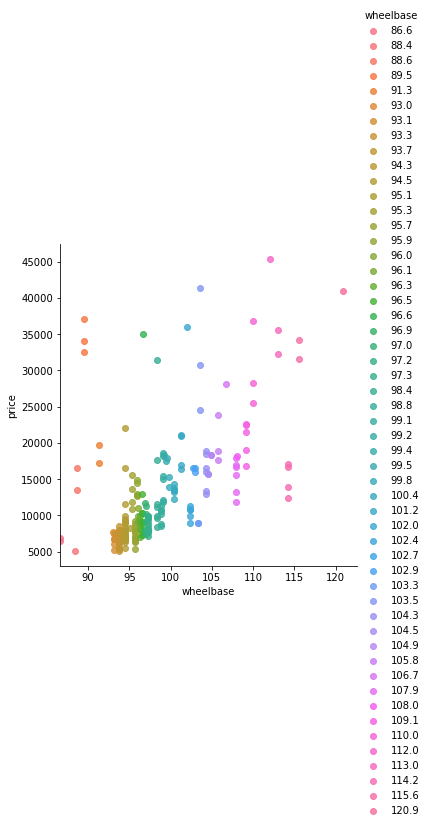

In [49]:
sns.lmplot(x = 'wheelbase', y = 'price', hue = 'wheelbase',  data =adata)

##### Dropping wheelbase column

In [50]:
adata = adata.drop(['wheelbase'], axis = 1)

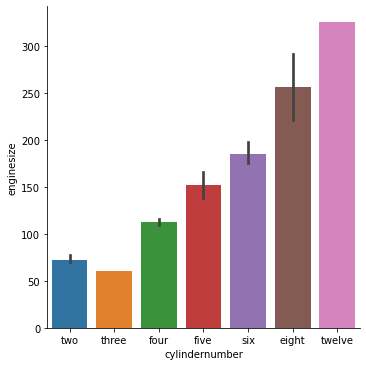

In [53]:
sns.catplot(y = 'enginesize', x = 'cylindernumber',kind = 'bar',order = ['two','three','four','five','six','eight','twelve'] ,data =adata)

* as expected , as number of ylinder increases enginesize increases, except for two and three ( there is aberration)

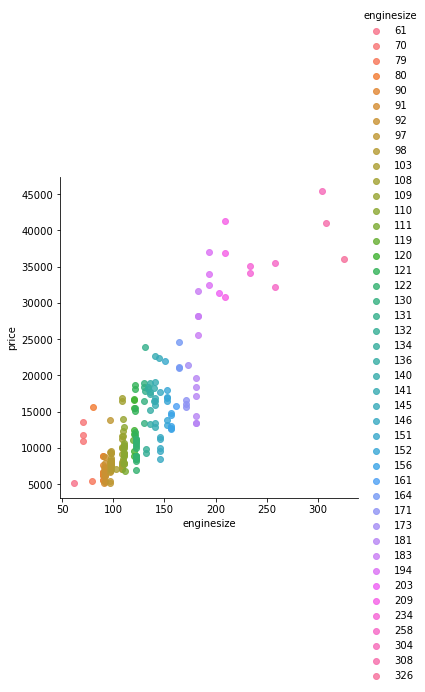

In [54]:
sns.lmplot(x='enginesize', y = 'price', hue = 'enginesize', data = adata)

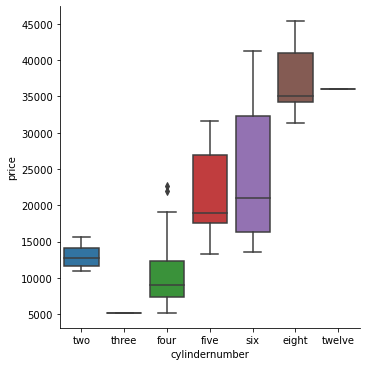

In [55]:
sns.catplot(y = 'price', x = 'cylindernumber',kind = 'box',order = ['two','three','four','five','six','eight','twelve'] ,data =adata)

OBSERVATION : as number of cylinder increases , price increases , same with enginesize , in this way we can remove one column as one column represents another in similar way

* dropping number of cylinder column

In [56]:
adata = adata.drop(['cylindernumber'], axis = 1)

In [57]:
adata['borestrokeratio']  = adata['boreratio']/adata['stroke']

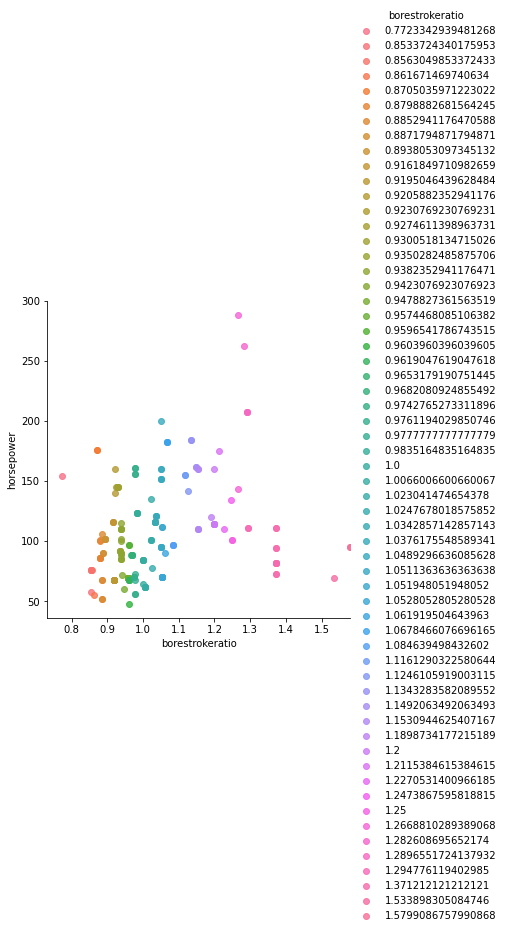

In [59]:
sns.lmplot(x= 'borestrokeratio', y = 'horsepower',hue= 'borestrokeratio', data = adata)

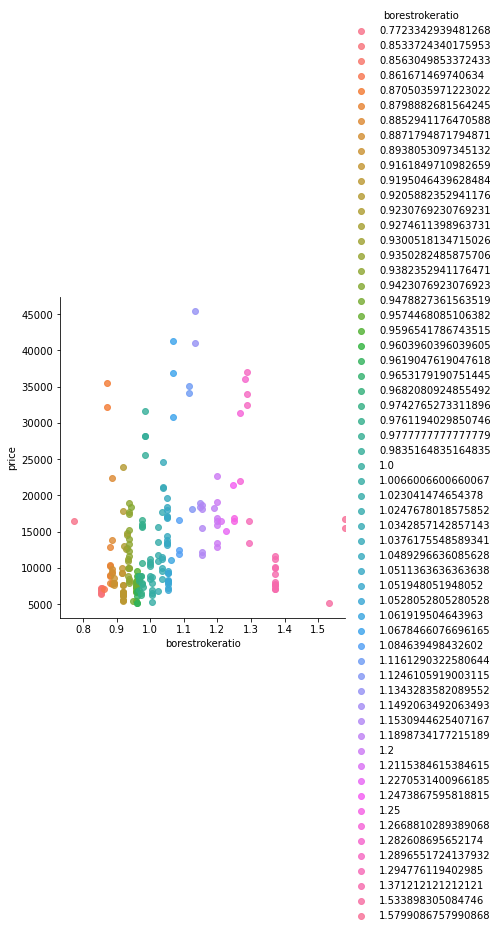

In [60]:
sns.lmplot(x= 'borestrokeratio', y = 'price',hue= 'borestrokeratio', data = adata)

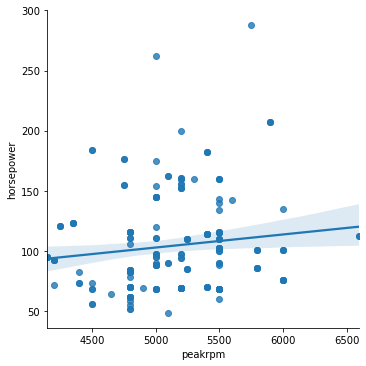

In [61]:
sns.lmplot(x= 'peakrpm', y = 'horsepower', data = adata)

In [62]:
adata = adata.drop(['boreratio','stroke'], axis = 1)

* Observation : Horsepoweris a function of torque and revolution per minutes

OBSERVATION : Horsepower is directly proportional to rmp, so RPM COLUMN IS Removed

In [65]:
adata = adata.drop(['peakrpm'], axis = 1)

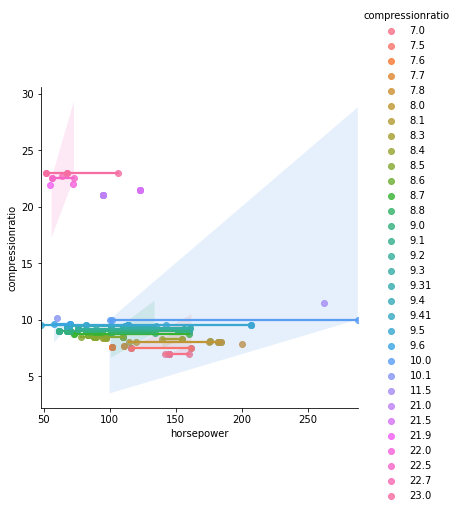

In [66]:
sns.lmplot(x= 'horsepower', y = 'compressionratio',hue = 'compressionratio', data = adata)

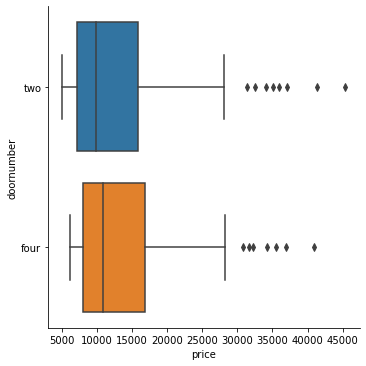

In [67]:
sns.catplot(x= 'price', y = 'doornumber', data = adata, kind = 'box')

* OBSERVATION : door number doesn't play a role in determination of price

DROPPING DOOR NUMBER COLUMNS

In [68]:
adata = adata.drop(['doornumber'], axis = 1)

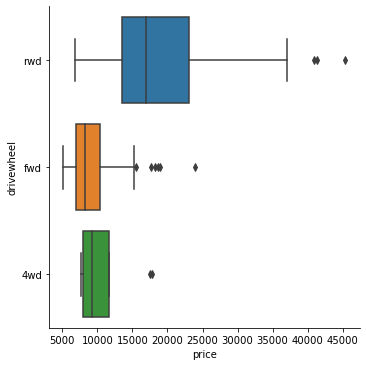

In [70]:
sns.catplot(x= 'price', y = 'drivewheel', data = adata, kind = 'box')

* As intutive drivewheel has a significant affects on price of a car

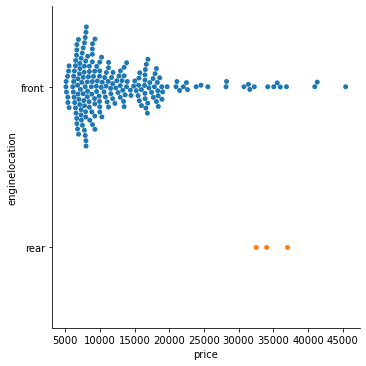

In [71]:
sns.catplot(x= 'price', y = 'enginelocation', data= adata, kind= 'swarm')

In [73]:
3/205

0.014634146341463415

1.4 %  cars have engine on rear side , it mean that this dataset is not indicative of effects of location of engine on PRICE 

REMOVING THE COLUMN OF ENGINE LOCATION

In [74]:
adata = adata.drop(['enginelocation'], axis = 1)

SMOOTHING OF NUMERICAL VARIABLE : ADATA

 DATA IS ALMOST SMOOTH

#### converting object type into categorical type

In [86]:
adata.fueltype = adata.fueltype.astype('category')

In [87]:
adata.aspiration = adata.aspiration.astype('category')

In [88]:
adata.carbody = adata.carbody.astype('category')

In [89]:
adata.drivewheel = adata.drivewheel.astype('category')

In [90]:
adata.enginetype = adata.enginetype.astype('category')

In [91]:
adata.fuelsystem = adata.fuelsystem.astype('category')

In [92]:
adata.maker = adata.maker.astype('category')

#### data copying for modelbuilding

In [93]:
bdata  = adata.copy()

### TRAIN TEST SPLIT

In [94]:
x = bdata.drop(['price'], axis = 1)
y = bdata['price']

In [95]:
x_train, x_test ,y_train ,y_test = train_test_split(x , y , test_size = 0.2, random_state = 123, shuffle = True)

### SEPARATION OF CATEGORICAL VARIABLE AND NUMERICAL VARIABLE

In [98]:
cat_attr = list(x_train.select_dtypes(include = ['category']).columns)

In [100]:
num_attr = list(x_train.select_dtypes(include = ['number']).columns)

### standarsizing numerical data

In [102]:
scaler = StandardScaler()
scaler.fit(x_train[num_attr])
x_train_std = pd.DataFrame(scaler.transform(x_train[num_attr]), columns = num_attr)
x_test_std  = pd.DataFrame(scaler.transform(x_test[num_attr]), columns = num_attr)

In [117]:
print(type(y_train))

<class 'pandas.core.series.Series'>


In [134]:
# copying of y_train
y_train_1  = y_train.copy()

In [135]:
y_train_1.shape

(164,)

In [136]:
print(type(y_train_1))

<class 'pandas.core.series.Series'>


In [137]:
y_train_1 = y_train_1.to_numpy()

In [154]:
y_test_1 = y_test_1.to_numpy()

In [138]:
print(type(y_train_1))

<class 'numpy.ndarray'>


In [139]:
y_train_1 = y_train_1.reshape(-1,1)

In [155]:
y_test_1 = y_test_1.reshape(-1,1)

In [140]:
y_train_1.shape

(164, 1)

In [153]:
# copiying of y test data
y_test_1 = y_test.copy()

In [143]:
scaler.fit(y_train_1)

StandardScaler()

In [147]:
y_train_1_std = pd.DataFrame(scaler.transform(y_train_1))

In [156]:
y_test_1_std = pd.DataFrame(scaler.transform(y_test_1))

In [157]:
y_test_1_std.mean()

0   -0.393275
dtype: float64

In [148]:
y_train_1_std.mean()

0    5.212632e-17
dtype: float64

In [149]:
y_train_1_std.std()

0    1.003063
dtype: float64

In [158]:
y_test_1_std.std()

0    0.778501
dtype: float64

#### ONE HOT ENCONDING OF CATEGORICAL DATA

In [105]:
ohe = OneHotEncoder()
ohe.fit(x_train[cat_attr])
columns_ohe = list(ohe.get_feature_names(cat_attr))
print(columns_ohe)

x_train_cat = ohe.transform(x_train[cat_attr])
x_test_cat = ohe.transform(x_test[cat_attr])

x_train_cat = pd.DataFrame(x_train_cat.todense(), columns = columns_ohe)
x_test_cat = pd.DataFrame(x_test_cat.todense(), columns = columns_ohe)

['fueltype_diesel', 'fueltype_gas', 'aspiration_std', 'aspiration_turbo', 'carbody_convertible', 'carbody_hardtop', 'carbody_hatchback', 'carbody_sedan', 'carbody_wagon', 'drivewheel_4wd', 'drivewheel_fwd', 'drivewheel_rwd', 'enginetype_dohc', 'enginetype_dohcv', 'enginetype_l', 'enginetype_ohc', 'enginetype_ohcf', 'enginetype_ohcv', 'enginetype_rotor', 'fuelsystem_1bbl', 'fuelsystem_2bbl', 'fuelsystem_4bbl', 'fuelsystem_idi', 'fuelsystem_mfi', 'fuelsystem_mpfi', 'fuelsystem_spdi', 'fuelsystem_spfi', 'maker_alfa-romero', 'maker_audi', 'maker_bmw', 'maker_buick', 'maker_chevrolet', 'maker_dodge', 'maker_honda', 'maker_isuzu', 'maker_jaguar', 'maker_mazda', 'maker_mercury', 'maker_mitsubishi', 'maker_nissan', 'maker_peugeot', 'maker_plymouth', 'maker_porsche', 'maker_renault', 'maker_saab', 'maker_subaru', 'maker_toyota', 'maker_volkswagen', 'maker_volvo']


In [106]:
x_train_prep = pd.concat([x_train_cat , x_train_std], axis =1)
x_test_prep  = pd.concat([x_test_cat , x_test_std], axis = 1)

In [150]:
LR = LinearRegression()
model = LR.fit(x_train_prep, y_train_1_std)

# performance

In [152]:
# train

y_train_pred = model.predict(x_train_prep)

print("MSE",metrics.mean_squared_error(y_train_1_std,y_train_pred))
print("R_Squared" , metrics.r2_score(y_train_1_std , y_train_pred))

MSE 0.05559528949816003
R_Squared 0.9444047105018399


In [159]:
# test

y_test_pred = model.predict(x_test_prep)
print("MSE",metrics.mean_squared_error(y_test_1_std,y_test_pred))
print("R_Squared" , metrics.r2_score(y_test_1_std , y_test_pred))

MSE 0.045335557458872765
R_Squared 0.9233265831161138


### OBSERVATION : WE are getting decent R_Squared in both Train and Test data 94% and 92% respectively